## Import

In [1]:
!pip install --upgrade huggingface_hub -q
!pip install -qq -U diffusers==0.31.0 transformers ftfy gradio accelerate -q
!pip install ftfy regex tqdm -q
!pip install git+https://github.com/openai/CLIP.git -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.4/481.4 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 116.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.9/46.9 MB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.7/354.7 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.4/11.4 MB 115.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/

In [2]:
!pip install ipdb -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.9 MB/s eta 0:00:00


In [3]:
import os
import cv2
import ipdb
import glob
import math
import clip
import random
import inspect
import numpy as np
import gradio as gr
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
from torch.utils.data import DataLoader, Dataset

from tqdm import tqdm
from PIL import Image
from typing import List, Optional, Union
from transformers import CLIPProcessor, CLIPModel

from diffusers import StableDiffusionInpaintPipeline

In [4]:
dataset_dir = "/content/drive/MyDrive/ECE570/project"

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
device = "cuda"

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
).to("cuda")

generator = torch.Generator(device=device).manual_seed(42)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

## Dataset Preprocessing

### Crop

In [7]:
class FrameDataset(Dataset):
    def __init__(self, frame_list, frame_dir, device):
        self.frame_list = frame_list
        self.frame_dir = frame_dir
        self.device = device

    def __len__(self):
        return len(self.frame_list)

    def __getitem__(self, idx):
        frame = self.frame_list[idx]
        frame_path = os.path.join(self.frame_dir, frame, f"{frame}.color_512.jpg")

        image = Image.open(frame_path).convert("RGB")

        pipe = StableDiffusionInpaintPipeline.from_pretrained(
            "stabilityai/stable-diffusion-2-inpainting",
            torch_dtype=torch.float16
        ).to(self.device)

        image_processed = pipe.image_processor.preprocess(
            image, height=512, width=512
        ).to(self.device, dtype=torch.float16)
        return image_processed, frame

def compute_bbox_for_frame(args):
    """
    For a single frame, load the person + obj masks,
    compute the bounding box (bmin, bmax), and return it.
    """
    frame_dir, f, threshold = args
    obj_path = os.path.join(frame_dir, f, f"{f}.obj_mask.png")
    person_path = os.path.join(frame_dir, f, f"{f}.person_mask.png")

    obj_mask = np.array(Image.open(obj_path))
    person_mask = np.array(Image.open(person_path))

    bmin, bmax = masks2bbox([person_mask, obj_mask], threshold=threshold)
    return bmin, bmax

def compute_global_bbox(frame_dir, frame_list, threshold=127, bbox_exp=1.0):
    """
    Parallel version that:
      1) Distributes frames to worker processes to compute per-frame bboxes
      2) Accumulates them into one global bmin, bmax
      3) Returns the final global_center, global_crop_size
    """
    global_bmin = np.array([np.inf, np.inf], dtype=float)
    global_bmax = np.array([-np.inf, -np.inf], dtype=float)

    num_workers = min(cpu_count(), 8)
    with Pool(num_workers) as p:
        results = p.map(
            compute_bbox_for_frame,
            [(frame_dir, f, threshold) for f in frame_list]
        )

    for bmin, bmax in results:
        bmin = bmin.astype(float)
        bmax = bmax.astype(float)
        global_bmin = np.minimum(global_bmin, bmin)
        global_bmax = np.maximum(global_bmax, bmax)

    global_center = (global_bmin + global_bmax) / 2.0
    width = global_bmax[0] - global_bmin[0]
    height = global_bmax[1] - global_bmin[1]
    crop_size = max(width, height) * bbox_exp

    crop_size = int(np.ceil(crop_size))
    if crop_size % 2 == 1:
        crop_size += 1
    global_center = global_center.astype(int)

    return global_center, crop_size

def masks2bbox(masks, threshold=127):
    """

    :param masks:
    :param threshold:
    :return: bounding box corner coordinate
    """
    mask_comb = np.zeros_like(masks[0], dtype=bool)
    for m in masks:
        mask_comb = mask_comb | (m > threshold)

    yid, xid = np.where(mask_comb)
    bmin = np.array([xid.min(), yid.min()])
    bmax = np.array([xid.max(), yid.max()])
    return bmin, bmax

def get_crop_params(mask_hum, mask_obj, bbox_exp=1.0):
    "compute bounding box based on masks"
    bmin, bmax = masks2bbox([mask_hum, mask_obj])
    crop_center = (bmin + bmax) // 2
    # crop_size = np.max(bmax - bmin)
    crop_size = int(np.max(bmax - bmin) * bbox_exp)
    if crop_size % 2 == 1:
        crop_size += 1  # make sure it is an even number
    return bmax, bmin, crop_center, crop_size

def crop(img, center, crop_size):
    """
    Crop a square region from 'img' of size 'crop_size' around 'center'.
    If the crop would extend outside the image, clamp and pad if needed.
    """
    assert isinstance(img, np.ndarray)
    h, w = img.shape[:2]

    # Ensure we don't request more than the image size
    crop_size = int(crop_size)
    crop_size = min(crop_size, w)  # don't exceed image width
    crop_size = min(crop_size, h)  # don't exceed image height

    half = crop_size // 2
    cx, cy = int(center[0]), int(center[1])

    x1 = cx - half
    y1 = cy - half
    x2 = x1 + crop_size
    y2 = y1 + crop_size

    # Clamp so the region stays within [0, w) and [0, h)
    if x1 < 0:
        x1 = 0
        x2 = crop_size
    elif x2 > w:
        x2 = w
        x1 = w - crop_size

    if y1 < 0:
        y1 = 0
        y2 = crop_size
    elif y2 > h:
        y2 = h
        y1 = h - crop_size

    # Now we have a square region [x1:x2, y1:y2] that fits in the image
    cropped = img[y1:y2, x1:x2]

    # If for some reason the subregion is smaller than crop_size (image < crop_size):
    # pad the difference
    pad_h = crop_size - (y2 - y1)
    pad_w = crop_size - (x2 - x1)

    if pad_h > 0 or pad_w > 0:
        if len(img.shape) == 3:
            cropped = np.pad(
                cropped,
                pad_width=((0,pad_h), (0,pad_w), (0,0)),
                mode='constant',
                constant_values=0
            )
        else:
            cropped = np.pad(
                cropped,
                pad_width=((0,pad_h), (0,pad_w)),
                mode='constant',
                constant_values=0
            )
    return cropped

def resize(img, img_size, mode=cv2.INTER_LINEAR):
    """
    resize image to the input
    :param img:
    :param img_size: (width, height) of the target image size
    :param mode:
    :return:
    """
    h, w = img.shape[:2]
    load_ratio = 1.0 * w / h
    netin_ratio = 1.0 * img_size[0] / img_size[1]
    assert load_ratio == netin_ratio, "image aspect ration not matching, given image: {}, net input: {}".format(
        img.shape, img_size)
    resized = cv2.resize(img, img_size, interpolation=mode)
    return resized


def extract_all_frames(video_path: str, output_folder: str) -> None:
    os.makedirs(output_folder, exist_ok=True)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise IOError(f"Cannot open video file {video_path}")

    frame_idx = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        filename = os.path.join(output_folder, f"frame_{frame_idx:05d}.jpg")
        cv2.imwrite(filename, frame)
        frame_idx += 1

    cap.release()
    print(f"Extracted {frame_idx} frames to '{output_folder}'.")

### Data Import

In [8]:
video_name = [
    "Date03_Sub03_tablesquare_lift",
    "Date03_Sub04_chairwood_sit",
    "Date03_Sub03_plasticcontainer"
]

video_prompt = [
    "square table",
    "wood chair",
    "plastic container"
]

In [9]:
def create_object_only_mask(video_dir):
    frame_dir = os.path.join(video_dir, "frame")
    object_mask_dir = os.path.join(video_dir, "mask")

    frame_list = sorted(os.listdir(frame_dir))
    object_mask_list = sorted(os.listdir(object_mask_dir))

    output_dir = os.path.join(video_dir, "object_only_mask")
    os.makedirs(output_dir, exist_ok=True)

    object_only_list = []
    for frame, mask in zip(frame_list, object_mask_list):
        img = Image.open(os.path.join(frame_dir, frame))
        obj_mask = Image.open(os.path.join(object_mask_dir, mask))

        img_np = np.array(img, dtype=np.float32)
        obj_mask_np = np.array(obj_mask, dtype=np.float32)

        binary_mask = (obj_mask_np > 0).astype(np.float32)
        binary_mask = binary_mask[:, :, None]

        img_np = img_np * binary_mask
        img_np = img_np.astype(np.uint8)
        img_np = Image.fromarray(img_np)

        frame_number = frame.split(".")[0]
        img_np.save(os.path.join(output_dir, f"{frame_number}.obj_mask.png"))

    return object_only_list

In [10]:
for video in tqdm(video_name, total=len(video_name), desc="Processing video"):
    create_object_only_mask(os.path.join(dataset_dir, video))

Processing video: 100%|██████████| 3/3 [03:01<00:00, 60.33s/it]


## Feature Extraction

In [11]:
def feature_extraction(pipe, generator, frame_dir, output_dir):

    def image_process(frame):
        processed = pipe.image_processor.preprocess(frame, height=512, width=512).to(
            device=device,
            dtype=torch.float16
        )

        return processed

    frame_list = sorted(os.listdir(frame_dir))

    # import ipdb; ipdb.set_trace()

    output_path = os.path.join(output_dir, "features.npy")

    frame_features = np.empty((len(frame_list), 4, 64, 64), dtype=np.float16)

    with torch.no_grad():
        for i, frame in tqdm(enumerate(frame_list), total=len(frame_list), desc="Extracting Features"):
            frame_path = os.path.join(frame_dir, frame)
            pil_frame = Image.open(frame_path)
            image_processed = image_process(pil_frame)
            features = pipe._encode_vae_image(image_processed, generator)
            frame_features[i] = features.cpu().numpy()

    print(frame_features.shape)
    print(frame_features[0].shape)

    np.save(output_path, frame_features, allow_pickle=False, fix_imports=False)

    print(f"Extracted features saved at {output_path}")

In [12]:
for video in video_name:
    frame_dir = os.path.join(dataset_dir, video, "frame")
    output_dir = os.path.join(dataset_dir, video)

    feature_extraction(pipe, generator, frame_dir, output_dir)

Extracting Features: 100%|██████████| 60/60 [00:09<00:00,  6.15it/s]


(60, 4, 64, 64)
(4, 64, 64)
Extracted features saved at /content/drive/MyDrive/ECE570/project/Date03_Sub03_tablesquare_lift/features.npy


Extracting Features: 100%|██████████| 60/60 [00:08<00:00,  7.27it/s]


(60, 4, 64, 64)
(4, 64, 64)
Extracted features saved at /content/drive/MyDrive/ECE570/project/Date03_Sub04_chairwood_sit/features.npy


Extracting Features: 100%|██████████| 60/60 [00:08<00:00,  7.16it/s]


(60, 4, 64, 64)
(4, 64, 64)
Extracted features saved at /content/drive/MyDrive/ECE570/project/Date03_Sub03_plasticcontainer/features.npy


In [13]:
feature_path = os.path.join(dataset_dir, video_name[0], "features.npy")
features = np.load(feature_path, allow_pickle=False)

print("Loaded feature array shape:", features.shape)

frame_idx = 0
print("Frame 0 feature map shape:", features[frame_idx].shape)

Loaded feature array shape: (60, 4, 64, 64)
Frame 0 feature map shape: (4, 64, 64)


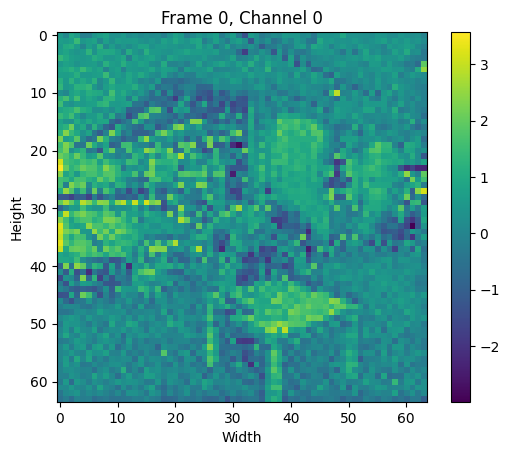

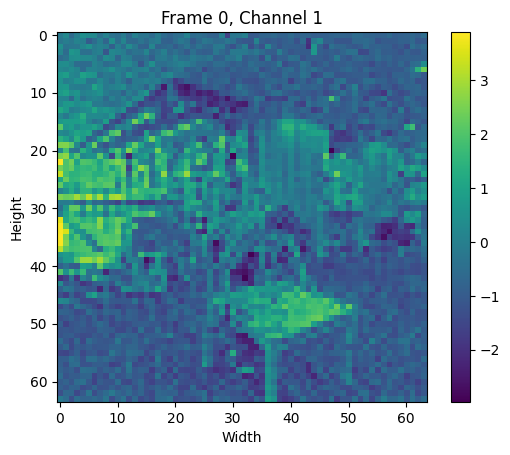

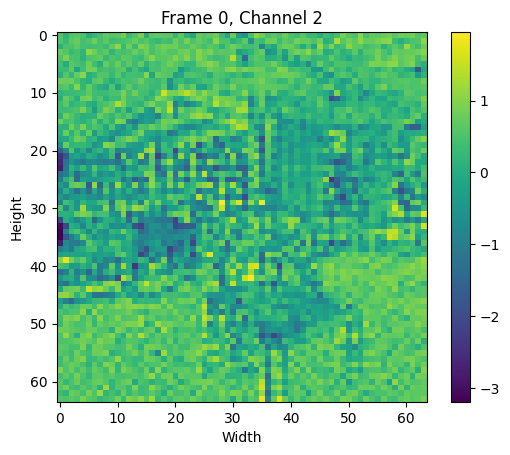

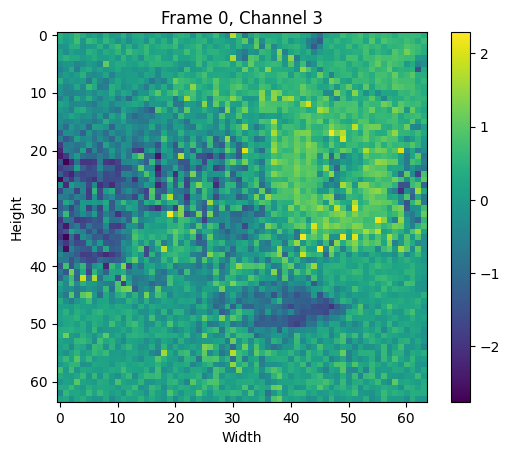

In [14]:
feat = features[frame_idx]   # shape (4, 64, 64)

# 1) Plot each channel as its own figure
for ch in range(feat.shape[0]):
    plt.figure()
    plt.imshow(feat[ch])          # default colormap
    plt.title(f"Frame {frame_idx}, Channel {ch}")
    plt.colorbar()                # show scale
    plt.xlabel("Width")
    plt.ylabel("Height")
    plt.show()

## Occlusion Region Identification

In [15]:
occluded_mask_dict = {}

for video in video_name:
    occlusion_mask_dir = os.path.join(dataset_dir, video, "occlusion_mask")
    os.makedirs(occlusion_mask_dir, exist_ok=True)

    object_gt_mask_dir = os.path.join(dataset_dir, video, "gt_mask")
    human_mask_dir = os.path.join(dataset_dir, video, "human")

    object_gt_mask_list = sorted(os.listdir(object_gt_mask_dir))
    human_mask_list = sorted(os.listdir(human_mask_dir))

    occluded_mask_list = []
    for obj, human in tqdm(zip(object_gt_mask_list, human_mask_list), total=len(object_gt_mask_list), desc="Finding occlusion"):
      obj_image = Image.open(os.path.join(object_gt_mask_dir, obj))
      human_image = Image.open(os.path.join(human_mask_dir, human))

      obj_np = np.array(obj_image)
      human_np = np.array(human_image)

      obj_np = obj_np.astype(np.uint8)
      human_np = human_np.astype(np.uint8)

      intersection = np.bitwise_and(obj_np, human_np)

      intersection = Image.fromarray(intersection)
      intersection = intersection.convert("L")

      frame_number = obj.split(".")[0]
      intersection.save(os.path.join(occlusion_mask_dir, f"{frame_number}.occlu_mask.png"))

      occluded_mask_list.append(intersection)

    occluded_mask_dict[video] = occluded_mask_list

Finding occlusion: 100%|██████████| 60/60 [00:50<00:00,  1.18it/s]


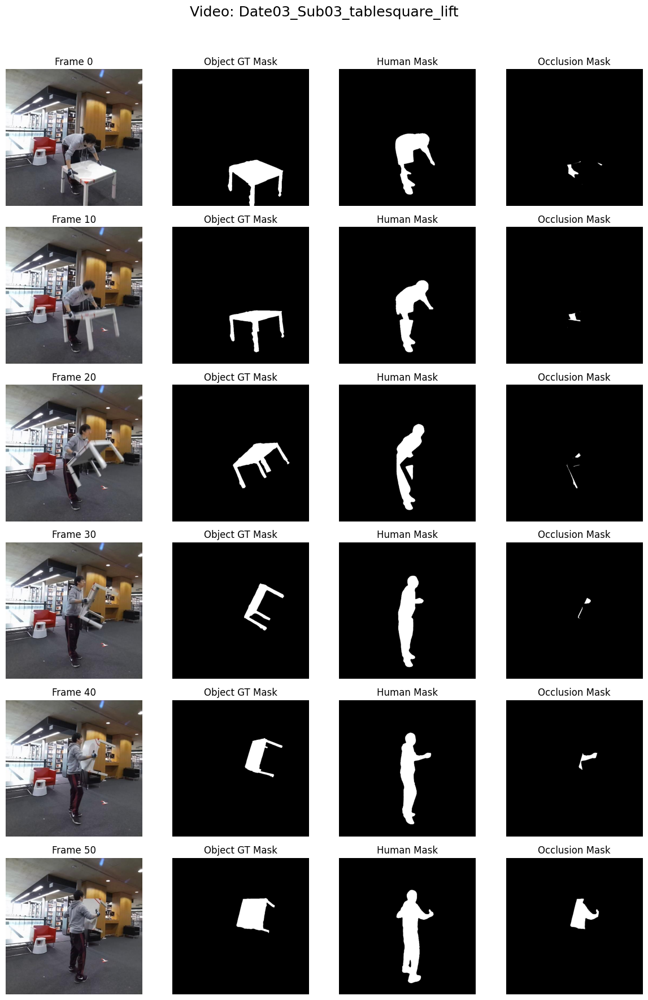

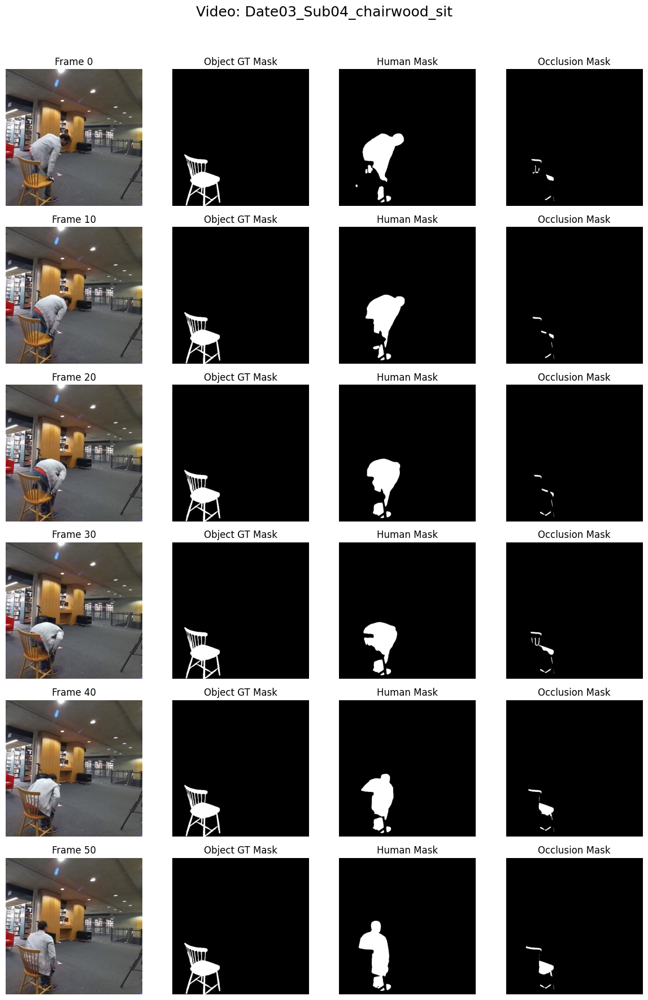

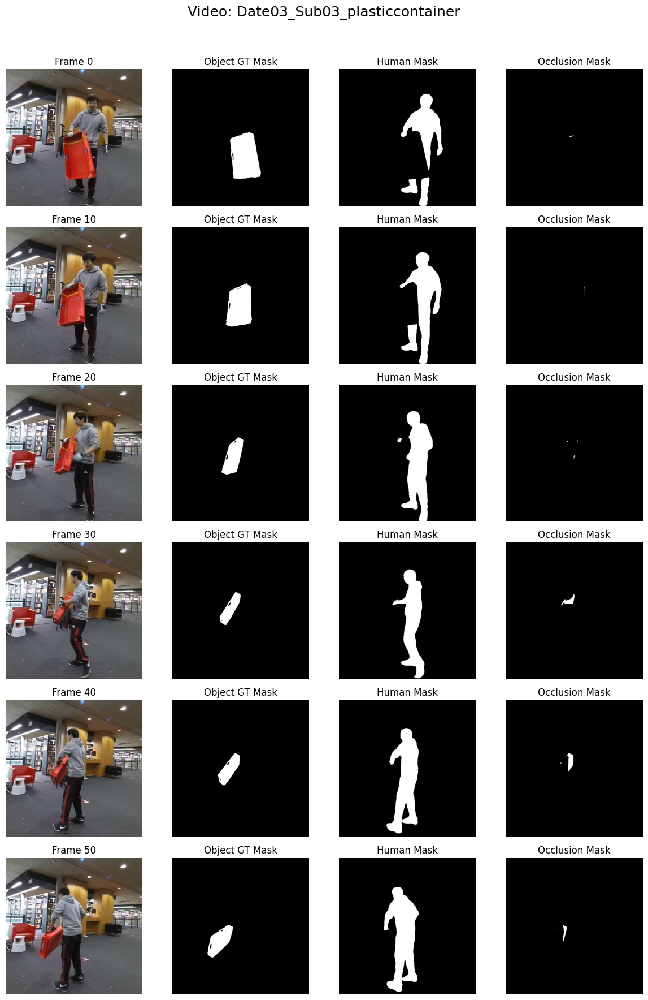

In [16]:
for video in video_name:
  frame_dir          = os.path.join(dataset_dir, video, "frame")
  object_gt_mask_dir = os.path.join(dataset_dir, video, "gt_mask")
  human_mask_dir     = os.path.join(dataset_dir, video, "human")
  occlu_mask_dir     = os.path.join(dataset_dir, video, "occlusion_mask")

  frame_files = sorted(os.listdir(frame_dir))
  gt_mask_files = sorted(os.listdir(object_gt_mask_dir))
  human_mask_files = sorted(os.listdir(human_mask_dir))
  occlu_mask_files = sorted(os.listdir(occlu_mask_dir))

  n_frames    = len(frame_files)

  step           = 10
  selected_idxs  = list(range(0, n_frames, step))
  n_rows         = len(selected_idxs)

  fig, axes = plt.subplots(n_rows, 4, figsize=(12, 3 * n_rows))

  fig.suptitle(f"Video: {video}", fontsize=18)


  for row, idx in enumerate(selected_idxs):
      frame_path      = os.path.join(frame_dir, frame_files[idx])
      obj_mask_path   = os.path.join(object_gt_mask_dir, gt_mask_files[idx])
      human_mask_path = os.path.join(human_mask_dir, human_mask_files[idx])
      occlu_path      = os.path.join(occlu_mask_dir, occlu_mask_files[idx])

      frame_img      = Image.open(frame_path)
      obj_mask_img   = Image.open(obj_mask_path)
      human_mask_img = Image.open(human_mask_path)
      occlu_img      = Image.open(occlu_path)

      axes[row, 0].imshow(frame_img)
      axes[row, 0].set_title(f"Frame {idx}")
      axes[row, 1].imshow(obj_mask_img, cmap="gray")
      axes[row, 1].set_title("Object GT Mask")
      axes[row, 2].imshow(human_mask_img, cmap="gray")
      axes[row, 2].set_title("Human Mask")
      axes[row, 3].imshow(occlu_img, cmap="gray")
      axes[row, 3].set_title("Occlusion Mask")

      for col in range(4):
          axes[row, col].axis("off")

  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.show()

## Cross-Attention

In [17]:
class CrossAttention(nn.Module):
    def __init__(self, embed_dim, num_heads=1):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.head_dim = embed_dim // num_heads

    def forward(self, xQ, xKV_list, mask=None):

        B, Nq, C = xQ.shape
        Nk = Nq

        Q = xQ.view(B, Nq, self.num_heads, self.head_dim).transpose(1, 2)

        scores_list = []
        for K in xKV_list:

            K = K.view(B, Nk, self.num_heads, self.head_dim).transpose(1, 2)
            scores = torch.matmul(Q, K.transpose(-2, -1)) / math.sqrt(self.head_dim)
            scores_list.append(scores)

        scores = torch.cat(scores_list, dim=-1)

        attn_weights = torch.softmax(scores, dim=-1)

        attn_weights_chunks = torch.chunk(attn_weights, len(xKV_list), dim=-1)

        context_list = []
        for attn_w_chunk, V in zip(attn_weights_chunks, xKV_list):
            V = V.view(B, Nk, self.num_heads, self.head_dim).transpose(1, 2)
            context_i = torch.matmul(attn_w_chunk, V)
            context_list.append(context_i)

        context = sum(context_list)

        context = context.transpose(1, 2).contiguous().view(B, Nq, C)

        return context, attn_weights

In [18]:
def feature_fusion(dataset_dir,
                    features_path,
                    output_path,
                    start_idx,
                    end_idx,
                    device):

    feat_np = np.load(features_path)
    feat = torch.from_numpy(feat_np).float().to(device)
    N, C, H, W = feat.shape

    gt_mask_dir    = os.path.join(dataset_dir, "gt_mask")
    all_masks      = sorted(os.listdir(gt_mask_dir))
    selected_masks = all_masks[start_idx:end_idx]

    mask_list = []
    for mask_fname in selected_masks:
        m = Image.open(os.path.join(gt_mask_dir, mask_fname)).convert("L")
        m = m.resize((W, H), Image.Resampling.LANCZOS)
        m = np.array(m, dtype=np.float32) / 255.0
        m = torch.from_numpy(m).unsqueeze(0).unsqueeze(0)
        mask_list.append(m.to(device))

    cross_attn = CrossAttention(embed_dim=C, num_heads=1).to(device)

    fused_list = []

    for i, m in enumerate(tqdm(mask_list, desc="Fusing features")):
        t = start_idx + i
        xQ = feat[t].unsqueeze(0)

        kv_idxs = [min(max(t + dt, 0), N - 1) for dt in (-3, -2, -1, +1, +2, +3)]
        xKV_list = [feat[idx].unsqueeze(0) for idx in kv_idxs]

        B, _, _, _ = xQ.shape
        Nq = H * W
        xQ_2D      = xQ.view(B, C, Nq).permute(0, 2, 1)
        xKV_2D_lst = [xKV.view(B, C, Nq).permute(0, 2, 1)
                       for xKV in xKV_list]

        out_2D, _ = cross_attn(xQ_2D, xKV_2D_lst, mask=None)
        out       = out_2D.permute(0, 2, 1).view(B, C, H, W)

        m_bin       = (m >= 0.5).float()
        out_masked  = out * m_bin

        fused_list.append(out_masked)

    fused_tensor = torch.cat(fused_list, dim=0)
    torch.save({
        'feature_fused_masked': fused_tensor.cpu(),
        'feature_fused_masked_shape': fused_tensor.shape
    }, output_path)

    print(f"Saved fused+masked features at {output_path}, shape {fused_tensor.shape}")

In [19]:
for video in tqdm(video_name, total=len(video_name), desc="Processing attention"):

  feature_fusion(
      dataset_dir=os.path.join(dataset_dir, video),
      features_path=os.path.join(dataset_dir, video, "features.npy"),
      output_path=os.path.join(dataset_dir, video, "features_fused_masked.pt"),
      start_idx=0,
      end_idx=60,
      device=device
  )


Processing attention:  33%|███▎      | 1/3 [00:01<00:03,  1.97s/it]

Saved fused+masked features at /content/drive/MyDrive/ECE570/project/Date03_Sub03_tablesquare_lift/features_fused_masked.pt, shape torch.Size([60, 4, 64, 64])



Processing attention:  67%|██████▋   | 2/3 [00:03<00:01,  1.94s/it]

Saved fused+masked features at /content/drive/MyDrive/ECE570/project/Date03_Sub04_chairwood_sit/features_fused_masked.pt, shape torch.Size([60, 4, 64, 64])



Processing attention: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]

Saved fused+masked features at /content/drive/MyDrive/ECE570/project/Date03_Sub03_plasticcontainer/features_fused_masked.pt, shape torch.Size([60, 4, 64, 64])


## Inpainting - Ours

In [28]:
def get_attn_feature(path):
    return torch.load(path)['feature_fused_masked']

def get_occluded_mask(video_dir):
    occluded_mask_dir = os.path.join(video_dir, "occlusion_mask")
    occluded_mask_list = []
    mask_list = sorted(os.listdir(occluded_mask_dir))

    for frame in mask_list:
        occluded_mask_path = os.path.join(occluded_mask_dir, frame)
        occluded_mask = Image.open(occluded_mask_path)
        occluded_mask_list.append(occluded_mask)

    return occluded_mask_list

def get_object_only_image(video_dir):
    object_only_dir = os.path.join(video_dir, "object_only_mask")
    object_only_list = []
    object_only_images = sorted(os.listdir(object_only_dir))

    for frame in object_only_images:
        if frame == "gt_mask":
          continue
        object_only_path = os.path.join(object_only_dir, frame)
        object_only = Image.open(object_only_path)
        object_only_list.append(object_only)

    return object_only_list

def get_frames_list(video_dir):
    frame_dir = os.path.join(video_dir, "frame")
    frame_list = sorted(os.listdir(frame_dir))

    return frame_list

In [29]:
def inpaint(pipe,
            video_dir,
            feat_fused_path,
            output_dir,
            prompt):

    pipe.safety_checker = None

    frame_list = get_frames_list(video_dir)
    feature_masked = get_attn_feature(feat_fused_path)
    occluded_mask_list = get_occluded_mask(video_dir)
    segmented_image = get_object_only_image(video_dir)
    # import ipdb; ipdb.set_trace()

    inpainted_result = []
    print(f" Output will be saved at: {output_dir}")
    print(f" Text Prompt: {prompt}")

    for t in tqdm(range(len(occluded_mask_list)), desc="Inpainting Progress", dynamic_ncols=True):
        prompt = prompt
        latent_feat = feature_masked[t].unsqueeze(0).half()
        input_img = segmented_image[t]
        mask_img = occluded_mask_list[t]
        strength = 0.9
        num_infer_steps = 50
        guid_scale = 7.5

        # print("latent feature shape: ", latent_feat.shape)
        # print("latent feature type: ", type(latent_feat))
        # print("latent feature data type: ", latent_feat.dtype)
        # print("input image type: ", type(input_img))
        # print("mask image type: ", type(mask_img))

        inpainted_image = pipe(prompt=prompt,
                               image=input_img,
                               mask_image=mask_img,
                               strength=strength,
                               latents=latent_feat,
                               num_inference_steps=num_infer_steps,
                               guidance_scale=guid_scale
                               ).images[0]

        frame_number = frame_list[t].split(".")[0]
        output_path = os.path.join(output_dir, f"{frame_number}.inpainted.jpg")
        inpainted_image.save(output_path)

        # print(f"Inpainted results are saved at {output_path}")

In [30]:
for i, video in tqdm(enumerate(video_name[2:]), total=len(video_name), desc="Processing inpainting"):
    video_dir = os.path.join(dataset_dir, video)
    feat_fused_path = os.path.join(dataset_dir, video, "features_fused_masked.pt")
    output_dir = os.path.join(dataset_dir, video, "inpainted")
    prompt = video_prompt[i]
    os.makedirs(output_dir, exist_ok=True)
    inpaint(pipe, video_dir, feat_fused_path, output_dir, prompt)

Processing inpainting:   0%|          | 0/3 [00:00<?, ?it/s]

 Output will be saved at: /content/drive/MyDrive/ECE570/project/Date03_Sub03_plasticcontainer/inpainted
 Text Prompt: square table



Inpainting Progress:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   2%|▏         | 1/60 [00:06<06:42,  6.82s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   3%|▎         | 2/60 [00:13<06:32,  6.76s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   5%|▌         | 3/60 [00:20<06:28,  6.82s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   7%|▋         | 4/60 [00:27<06:23,  6.84s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   8%|▊         | 5/60 [00:34<06:18,  6.88s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  10%|█         | 6/60 [00:41<06:11,  6.87s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  12%|█▏        | 7/60 [00:47<06:04,  6.88s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  13%|█▎        | 8/60 [00:54<05:56,  6.85s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  15%|█▌        | 9/60 [01:01<05:48,  6.83s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  17%|█▋        | 10/60 [01:08<05:44,  6.89s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  18%|█▊        | 11/60 [01:15<05:34,  6.83s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  20%|██        | 12/60 [01:22<05:26,  6.81s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  22%|██▏       | 13/60 [01:28<05:21,  6.84s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  23%|██▎       | 14/60 [01:35<05:14,  6.84s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  25%|██▌       | 15/60 [01:43<05:21,  7.15s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  27%|██▋       | 16/60 [01:50<05:10,  7.06s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  28%|██▊       | 17/60 [01:57<05:01,  7.02s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  30%|███       | 18/60 [02:04<04:51,  6.95s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  32%|███▏      | 19/60 [02:11<04:44,  6.93s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  33%|███▎      | 20/60 [02:17<04:36,  6.91s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  35%|███▌      | 21/60 [02:24<04:27,  6.87s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  37%|███▋      | 22/60 [02:31<04:20,  6.86s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  38%|███▊      | 23/60 [02:38<04:13,  6.84s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  40%|████      | 24/60 [02:45<04:06,  6.84s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  42%|████▏     | 25/60 [02:52<03:58,  6.83s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  43%|████▎     | 26/60 [02:58<03:51,  6.80s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  45%|████▌     | 27/60 [03:05<03:43,  6.78s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  47%|████▋     | 28/60 [03:12<03:36,  6.78s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  48%|████▊     | 29/60 [03:19<03:30,  6.79s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  50%|█████     | 30/60 [03:25<03:23,  6.77s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  52%|█████▏    | 31/60 [03:32<03:16,  6.79s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  53%|█████▎    | 32/60 [03:39<03:10,  6.79s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  55%|█████▌    | 33/60 [03:46<03:03,  6.81s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  57%|█████▋    | 34/60 [03:53<02:56,  6.80s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  58%|█████▊    | 35/60 [03:59<02:49,  6.77s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  60%|██████    | 36/60 [04:06<02:42,  6.78s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  62%|██████▏   | 37/60 [04:13<02:36,  6.79s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  63%|██████▎   | 38/60 [04:20<02:29,  6.78s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  65%|██████▌   | 39/60 [04:26<02:22,  6.77s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  67%|██████▋   | 40/60 [04:33<02:15,  6.77s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  68%|██████▊   | 41/60 [04:40<02:09,  6.80s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  70%|███████   | 42/60 [04:47<02:02,  6.82s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  72%|███████▏  | 43/60 [04:54<01:55,  6.82s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  73%|███████▎  | 44/60 [05:01<01:49,  6.81s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  75%|███████▌  | 45/60 [05:07<01:41,  6.78s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  77%|███████▋  | 46/60 [05:14<01:35,  6.80s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  78%|███████▊  | 47/60 [05:21<01:28,  6.80s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  80%|████████  | 48/60 [05:28<01:21,  6.83s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  82%|████████▏ | 49/60 [05:35<01:14,  6.81s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  83%|████████▎ | 50/60 [05:41<01:08,  6.82s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  85%|████████▌ | 51/60 [05:48<01:01,  6.81s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  87%|████████▋ | 52/60 [05:55<00:54,  6.80s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  88%|████████▊ | 53/60 [06:02<00:47,  6.78s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  90%|█████████ | 54/60 [06:08<00:40,  6.78s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  92%|█████████▏| 55/60 [06:15<00:34,  6.80s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  93%|█████████▎| 56/60 [06:22<00:27,  6.81s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  95%|█████████▌| 57/60 [06:29<00:20,  6.84s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  97%|█████████▋| 58/60 [06:36<00:13,  6.83s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  98%|█████████▊| 59/60 [06:43<00:06,  6.81s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Processing inpainting:  33%|███▎      | 1/3 [06:50<13:40, 410.24s/it]


## Inpainting - Stable Diffusion with Random noise

In [31]:
def inpaint(pipe,
            video_dirh,
            generator,
            output_dir,
            prompt):

    pipe.safety_checker = None

    frame_list = get_frames_list(video_dir)
    occluded_mask_list = get_occluded_mask(video_dir)
    segmented_image = get_object_only_image(video_dir)

    inpainted_result = []
    print(f" Output will be saved at: {output_dir}")
    print(f" Text Prompt: {prompt}")

    for t in tqdm(range(len(occluded_mask_list)), desc="Inpainting Progress", dynamic_ncols=True):
        prompt = prompt
        input_img = segmented_image[t]
        mask_img = occluded_mask_list[t]
        strength = 0.9
        num_infer_steps = 50
        guid_scale = 7.5

        # print("latent feature shape: ", latent_feat.shape)
        # print("latent feature type: ", type(latent_feat))
        # print("latent feature data type: ", latent_feat.dtype)
        # print("input image type: ", type(input_img))
        # print("mask image type: ", type(mask_img))

        inpainted_image = pipe(prompt=prompt,
                               image=input_img,
                               mask_image=mask_img,
                               strength=strength,
                               generator=generator,
                               num_inference_steps=num_infer_steps,
                               guidance_scale=guid_scale
                               ).images[0]

        frame_number = frame_list[t].split(".")[0]
        output_path = os.path.join(output_dir, f"{frame_number}.inpainted.jpg")
        inpainted_image.save(output_path)

        # print(f"Inpainted results are saved at {output_path}")

In [32]:
for i, video in tqdm(enumerate(video_name), total=len(video_name), desc="Processing inpainting"):
    video_dir = os.path.join(dataset_dir, video)
    generator = torch.Generator(device=device).manual_seed(42)
    output_dir = os.path.join(dataset_dir, video, "inpainted_random")
    prompt = video_prompt[i]
    os.makedirs(output_dir, exist_ok=True)
    inpaint(pipe, video_dir, generator, output_dir, prompt)

Processing inpainting:   0%|          | 0/3 [00:00<?, ?it/s]

 Output will be saved at: /content/drive/MyDrive/ECE570/project/Date03_Sub03_tablesquare_lift/inpainted_random
 Text Prompt: square table



Inpainting Progress:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   2%|▏         | 1/60 [00:06<06:31,  6.63s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   3%|▎         | 2/60 [00:13<06:23,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   5%|▌         | 3/60 [00:19<06:18,  6.64s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   7%|▋         | 4/60 [00:26<06:14,  6.69s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   8%|▊         | 5/60 [00:33<06:09,  6.72s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  10%|█         | 6/60 [00:40<06:02,  6.71s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  12%|█▏        | 7/60 [00:46<05:55,  6.70s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  13%|█▎        | 8/60 [00:53<05:47,  6.68s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  15%|█▌        | 9/60 [01:00<05:38,  6.64s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  17%|█▋        | 10/60 [01:06<05:31,  6.63s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  18%|█▊        | 11/60 [01:13<05:23,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  20%|██        | 12/60 [01:19<05:16,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  22%|██▏       | 13/60 [01:26<05:09,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  23%|██▎       | 14/60 [01:32<05:03,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  25%|██▌       | 15/60 [01:39<04:57,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  27%|██▋       | 16/60 [01:46<04:50,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  28%|██▊       | 17/60 [01:52<04:44,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  30%|███       | 18/60 [01:59<04:37,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  32%|███▏      | 19/60 [02:06<04:31,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  33%|███▎      | 20/60 [02:12<04:24,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  35%|███▌      | 21/60 [02:19<04:17,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  37%|███▋      | 22/60 [02:25<04:10,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  38%|███▊      | 23/60 [02:32<04:04,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  40%|████      | 24/60 [02:39<03:57,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  42%|████▏     | 25/60 [02:45<03:51,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  43%|████▎     | 26/60 [02:52<03:44,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  45%|████▌     | 27/60 [02:58<03:37,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  47%|████▋     | 28/60 [03:05<03:31,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  48%|████▊     | 29/60 [03:12<03:24,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  50%|█████     | 30/60 [03:18<03:18,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  52%|█████▏    | 31/60 [03:25<03:11,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  53%|█████▎    | 32/60 [03:31<03:05,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  55%|█████▌    | 33/60 [03:38<02:58,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  57%|█████▋    | 34/60 [03:45<02:51,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  58%|█████▊    | 35/60 [03:51<02:45,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  60%|██████    | 36/60 [03:58<02:38,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  62%|██████▏   | 37/60 [04:04<02:31,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  63%|██████▎   | 38/60 [04:11<02:25,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  65%|██████▌   | 39/60 [04:18<02:18,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  67%|██████▋   | 40/60 [04:24<02:11,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  68%|██████▊   | 41/60 [04:31<02:05,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  70%|███████   | 42/60 [04:37<01:58,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  72%|███████▏  | 43/60 [04:44<01:52,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  73%|███████▎  | 44/60 [04:51<01:45,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  75%|███████▌  | 45/60 [04:57<01:38,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  77%|███████▋  | 46/60 [05:04<01:32,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  78%|███████▊  | 47/60 [05:10<01:25,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  80%|████████  | 48/60 [05:17<01:19,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  82%|████████▏ | 49/60 [05:24<01:12,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  83%|████████▎ | 50/60 [05:30<01:06,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  85%|████████▌ | 51/60 [05:37<00:59,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  87%|████████▋ | 52/60 [05:44<00:52,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  88%|████████▊ | 53/60 [05:50<00:46,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  90%|█████████ | 54/60 [05:57<00:39,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  92%|█████████▏| 55/60 [06:03<00:33,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  93%|█████████▎| 56/60 [06:10<00:26,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  95%|█████████▌| 57/60 [06:17<00:19,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  97%|█████████▋| 58/60 [06:23<00:13,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  98%|█████████▊| 59/60 [06:30<00:06,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Processing inpainting:  33%|███▎      | 1/3 [06:37<13:14, 397.23s/it]

 Output will be saved at: /content/drive/MyDrive/ECE570/project/Date03_Sub04_chairwood_sit/inpainted_random
 Text Prompt: wood chair



Inpainting Progress:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   2%|▏         | 1/60 [00:06<06:29,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   3%|▎         | 2/60 [00:13<06:22,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   5%|▌         | 3/60 [00:19<06:16,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   7%|▋         | 4/60 [00:26<06:10,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   8%|▊         | 5/60 [00:33<06:03,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  10%|█         | 6/60 [00:39<05:56,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  12%|█▏        | 7/60 [00:46<05:50,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  13%|█▎        | 8/60 [00:52<05:43,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  15%|█▌        | 9/60 [00:59<05:36,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  17%|█▋        | 10/60 [01:06<05:30,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  18%|█▊        | 11/60 [01:12<05:23,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  20%|██        | 12/60 [01:19<05:16,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  22%|██▏       | 13/60 [01:25<05:10,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  23%|██▎       | 14/60 [01:32<05:03,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  25%|██▌       | 15/60 [01:39<04:57,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  27%|██▋       | 16/60 [01:45<04:50,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  28%|██▊       | 17/60 [01:52<04:44,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  30%|███       | 18/60 [01:58<04:37,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  32%|███▏      | 19/60 [02:05<04:31,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  33%|███▎      | 20/60 [02:12<04:24,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  35%|███▌      | 21/60 [02:18<04:17,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  37%|███▋      | 22/60 [02:25<04:11,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  38%|███▊      | 23/60 [02:31<04:04,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  40%|████      | 24/60 [02:38<03:58,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  42%|████▏     | 25/60 [02:45<03:51,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  43%|████▎     | 26/60 [02:51<03:44,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  45%|████▌     | 27/60 [02:58<03:38,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  47%|████▋     | 28/60 [03:05<03:31,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  48%|████▊     | 29/60 [03:11<03:25,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  50%|█████     | 30/60 [03:18<03:18,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  52%|█████▏    | 31/60 [03:24<03:11,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  53%|█████▎    | 32/60 [03:31<03:05,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  55%|█████▌    | 33/60 [03:38<02:58,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  57%|█████▋    | 34/60 [03:44<02:51,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  58%|█████▊    | 35/60 [03:51<02:45,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  60%|██████    | 36/60 [03:58<02:38,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  62%|██████▏   | 37/60 [04:04<02:32,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  63%|██████▎   | 38/60 [04:11<02:25,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  65%|██████▌   | 39/60 [04:17<02:18,  6.62s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  67%|██████▋   | 40/60 [04:24<02:12,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  68%|██████▊   | 41/60 [04:31<02:05,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  70%|███████   | 42/60 [04:37<01:58,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  72%|███████▏  | 43/60 [04:44<01:52,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  73%|███████▎  | 44/60 [04:50<01:45,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  75%|███████▌  | 45/60 [04:57<01:39,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  77%|███████▋  | 46/60 [05:04<01:32,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  78%|███████▊  | 47/60 [05:10<01:25,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  80%|████████  | 48/60 [05:17<01:19,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  82%|████████▏ | 49/60 [05:23<01:12,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  83%|████████▎ | 50/60 [05:30<01:05,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  85%|████████▌ | 51/60 [05:37<00:59,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  87%|████████▋ | 52/60 [05:43<00:52,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  88%|████████▊ | 53/60 [05:50<00:46,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  90%|█████████ | 54/60 [05:56<00:39,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  92%|█████████▏| 55/60 [06:03<00:33,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  93%|█████████▎| 56/60 [06:10<00:26,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  95%|█████████▌| 57/60 [06:16<00:19,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  97%|█████████▋| 58/60 [06:23<00:13,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  98%|█████████▊| 59/60 [06:29<00:06,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Processing inpainting:  67%|██████▋   | 2/3 [13:13<06:36, 396.94s/it]

 Output will be saved at: /content/drive/MyDrive/ECE570/project/Date03_Sub03_plasticcontainer/inpainted_random
 Text Prompt: plastic container



Inpainting Progress:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   2%|▏         | 1/60 [00:06<06:29,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   3%|▎         | 2/60 [00:13<06:22,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   5%|▌         | 3/60 [00:19<06:16,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   7%|▋         | 4/60 [00:26<06:09,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:   8%|▊         | 5/60 [00:33<06:03,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  10%|█         | 6/60 [00:39<05:56,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  12%|█▏        | 7/60 [00:46<05:50,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  13%|█▎        | 8/60 [00:52<05:43,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  15%|█▌        | 9/60 [00:59<05:37,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  17%|█▋        | 10/60 [01:06<05:29,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  18%|█▊        | 11/60 [01:12<05:23,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  20%|██        | 12/60 [01:19<05:16,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  22%|██▏       | 13/60 [01:25<05:10,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  23%|██▎       | 14/60 [01:32<05:03,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  25%|██▌       | 15/60 [01:39<04:57,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  27%|██▋       | 16/60 [01:45<04:50,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  28%|██▊       | 17/60 [01:52<04:44,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  30%|███       | 18/60 [01:58<04:37,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  32%|███▏      | 19/60 [02:05<04:30,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  33%|███▎      | 20/60 [02:12<04:24,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  35%|███▌      | 21/60 [02:18<04:17,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  37%|███▋      | 22/60 [02:25<04:10,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  38%|███▊      | 23/60 [02:31<04:04,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  40%|████      | 24/60 [02:38<03:57,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  42%|████▏     | 25/60 [02:45<03:51,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  43%|████▎     | 26/60 [02:51<03:44,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  45%|████▌     | 27/60 [02:58<03:38,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  47%|████▋     | 28/60 [03:04<03:31,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  48%|████▊     | 29/60 [03:11<03:24,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  50%|█████     | 30/60 [03:18<03:18,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  52%|█████▏    | 31/60 [03:24<03:11,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  53%|█████▎    | 32/60 [03:31<03:04,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  55%|█████▌    | 33/60 [03:37<02:58,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  57%|█████▋    | 34/60 [03:44<02:51,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  58%|█████▊    | 35/60 [03:51<02:45,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  60%|██████    | 36/60 [03:57<02:38,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  62%|██████▏   | 37/60 [04:04<02:31,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  63%|██████▎   | 38/60 [04:10<02:25,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  65%|██████▌   | 39/60 [04:17<02:18,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  67%|██████▋   | 40/60 [04:24<02:12,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  68%|██████▊   | 41/60 [04:30<02:05,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  70%|███████   | 42/60 [04:37<01:58,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  72%|███████▏  | 43/60 [04:43<01:52,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  73%|███████▎  | 44/60 [04:50<01:45,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  75%|███████▌  | 45/60 [04:57<01:39,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  77%|███████▋  | 46/60 [05:03<01:32,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  78%|███████▊  | 47/60 [05:10<01:25,  6.61s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  80%|████████  | 48/60 [05:16<01:19,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  82%|████████▏ | 49/60 [05:23<01:12,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  83%|████████▎ | 50/60 [05:30<01:05,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  85%|████████▌ | 51/60 [05:36<00:59,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  87%|████████▋ | 52/60 [05:43<00:52,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  88%|████████▊ | 53/60 [05:49<00:46,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  90%|█████████ | 54/60 [05:56<00:39,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  92%|█████████▏| 55/60 [06:03<00:32,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  93%|█████████▎| 56/60 [06:09<00:26,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  95%|█████████▌| 57/60 [06:16<00:19,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  97%|█████████▋| 58/60 [06:22<00:13,  6.59s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Inpainting Progress:  98%|█████████▊| 59/60 [06:29<00:06,  6.60s/it]

  0%|          | 0/45 [00:00<?, ?it/s]


Processing inpainting: 100%|██████████| 3/3 [19:50<00:00, 396.76s/it]


## Visualization

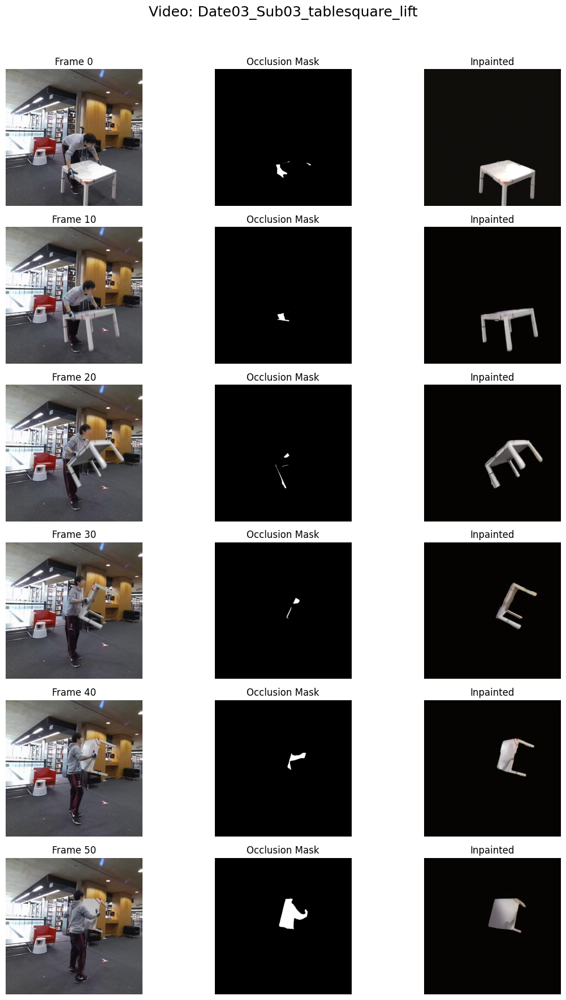

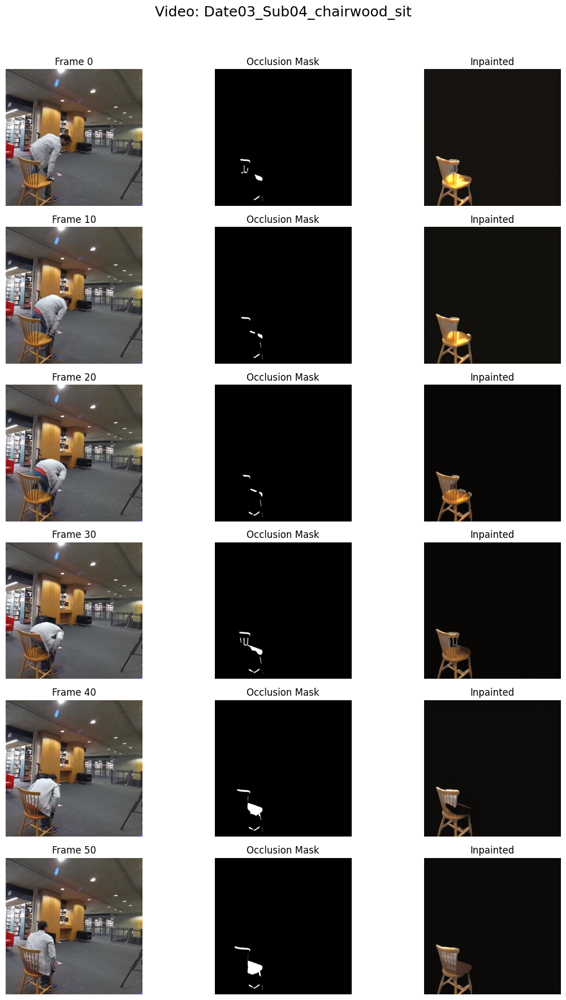

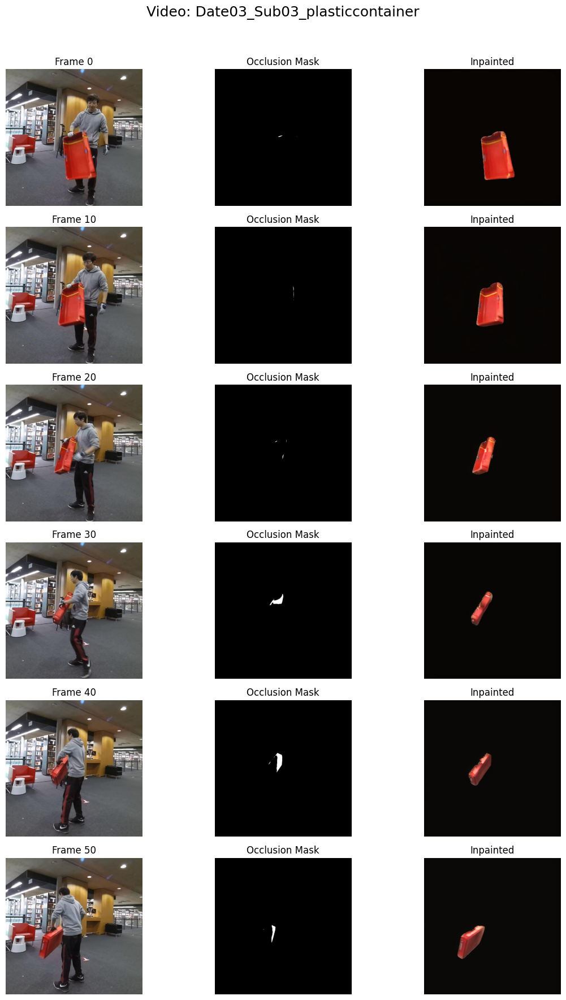

In [34]:
for video in video_name:
  frame_dir          = os.path.join(dataset_dir, video, "frame")
  occlu_mask_dir     = os.path.join(dataset_dir, video, "occlusion_mask")
  inpainted_dir     = os.path.join(dataset_dir, video, "inpainted")

  frame_files = sorted(os.listdir(frame_dir))
  occlu_mask_files = sorted(os.listdir(occlu_mask_dir))
  inpainted_files = sorted(os.listdir(inpainted_dir))

  n_frames    = len(frame_files)

  step           = 10
  selected_idxs  = list(range(0, n_frames, step))
  n_rows         = len(selected_idxs)

  fig, axes = plt.subplots(n_rows, 3, figsize=(12, 3 * n_rows))

  fig.suptitle(f"Video: {video}", fontsize=18)


  for row, idx in enumerate(selected_idxs):
      frame_path      = os.path.join(frame_dir, frame_files[idx])
      occlu_path      = os.path.join(occlu_mask_dir, occlu_mask_files[idx])
      inpainted_path      = os.path.join(inpainted_dir, inpainted_files[idx])

      frame_img      = Image.open(frame_path)
      occlu_img      = Image.open(occlu_path)
      inpainted      = Image.open(inpainted_path)

      axes[row, 0].imshow(frame_img)
      axes[row, 0].set_title(f"Frame {idx}")
      axes[row, 1].imshow(occlu_img, cmap="gray")
      axes[row, 1].set_title("Occlusion Mask")
      axes[row, 2].imshow(inpainted)
      axes[row, 2].set_title("Inpainted")

      for col in range(3):
          axes[row, col].axis("off")

  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.show()

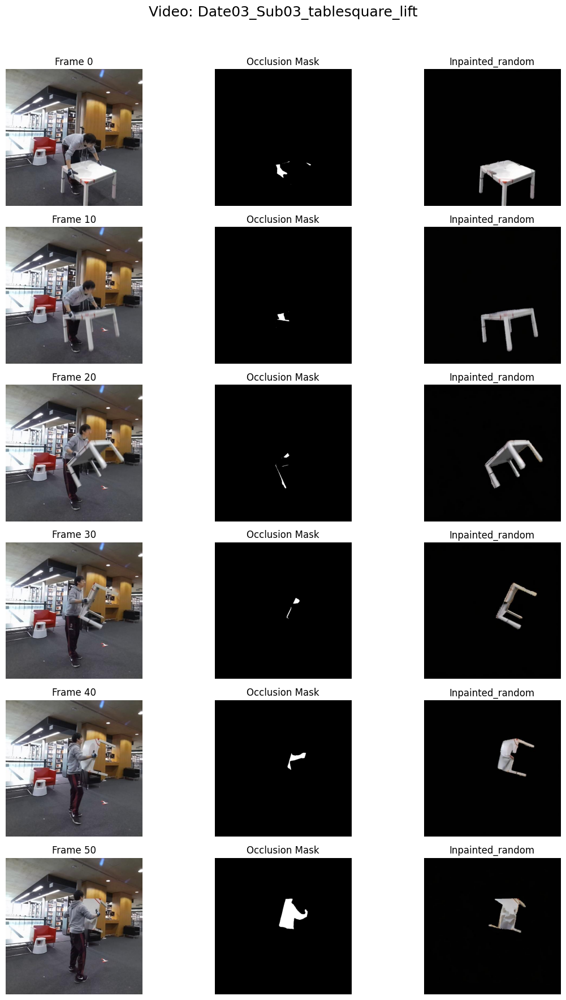

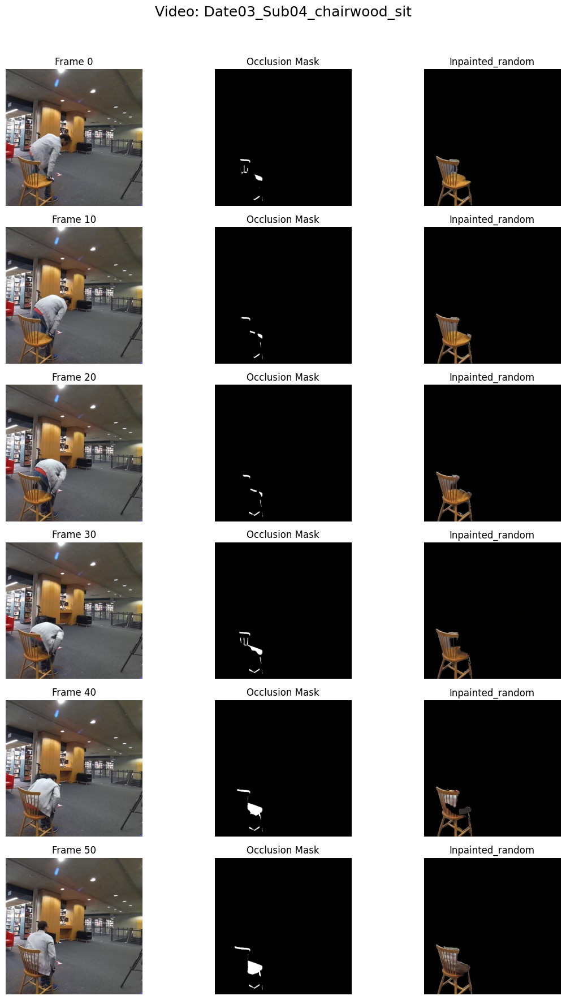

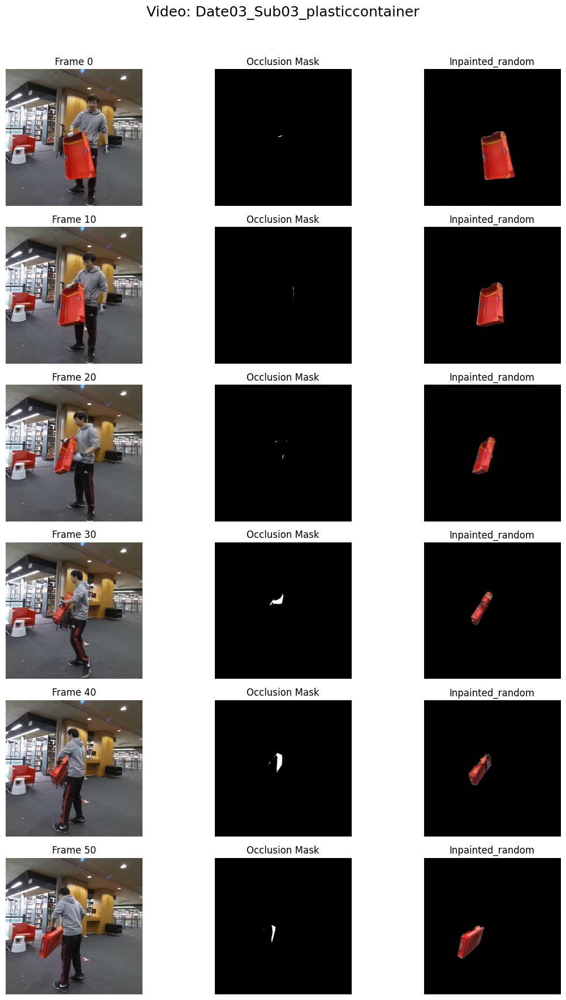

In [35]:
for video in video_name:
  frame_dir          = os.path.join(dataset_dir, video, "frame")
  occlu_mask_dir     = os.path.join(dataset_dir, video, "occlusion_mask")
  inpainted_dir     = os.path.join(dataset_dir, video, "inpainted_random")

  frame_files = sorted(os.listdir(frame_dir))
  occlu_mask_files = sorted(os.listdir(occlu_mask_dir))
  inpainted_files = sorted(os.listdir(inpainted_dir))

  n_frames    = len(frame_files)

  step           = 10
  selected_idxs  = list(range(0, n_frames, step))
  n_rows         = len(selected_idxs)

  fig, axes = plt.subplots(n_rows, 3, figsize=(12, 3 * n_rows))

  fig.suptitle(f"Video: {video}", fontsize=18)


  for row, idx in enumerate(selected_idxs):
      frame_path      = os.path.join(frame_dir, frame_files[idx])
      occlu_path      = os.path.join(occlu_mask_dir, occlu_mask_files[idx])
      inpainted_path      = os.path.join(inpainted_dir, inpainted_files[idx])

      frame_img      = Image.open(frame_path)
      occlu_img      = Image.open(occlu_path)
      inpainted_random = Image.open(inpainted_path)

      axes[row, 0].imshow(frame_img)
      axes[row, 0].set_title(f"Frame {idx}")
      axes[row, 1].imshow(occlu_img, cmap="gray")
      axes[row, 1].set_title("Occlusion Mask")
      axes[row, 2].imshow(inpainted_random)
      axes[row, 2].set_title("Inpainted_random")

      for col in range(3):
          axes[row, col].axis("off")

  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.show()

## Evaluation

### Generating Segmented Mask

In [36]:
for video in video_name:
    video_dir = os.path.join(dataset_dir, video)
    inpainted = sorted(os.listdir(os.path.join(video_dir, "inpainted")))

    output_dir = os.path.join(video_dir, "inpainted_mask_final")
    os.makedirs(output_dir, exist_ok=True)

    for frame in inpainted:
        inpainted_path = os.path.join(video_dir, "inpainted", frame)
        image = Image.open(inpainted_path)
        image_gray = image.convert('L')

        threshold = 20
        image_binary = image_gray.point(lambda p: 255 if p > threshold else 0, '1')

        frame_number = frame.split(".")[0]
        output_path = os.path.join(output_dir, f"{frame_number}.inpainted_mask.png")
        image_binary.save(output_path)
        img_np = np.array(image_binary)
        # import ipdb; ipdb.set_trace()

In [45]:
for video in video_name:
    video_dir = os.path.join(dataset_dir, video)
    inpainted = sorted(os.listdir(os.path.join(video_dir, "inpainted_random")))

    output_dir = os.path.join(video_dir, "inpainted_mask_final")
    os.makedirs(output_dir, exist_ok=True)

    for frame in inpainted:
        inpainted_path = os.path.join(video_dir, "inpainted_random", frame)
        image = Image.open(inpainted_path)
        image_gray = image.convert('L')

        threshold = 20
        image_binary = image_gray.point(lambda p: 255 if p > threshold else 0, '1')

        frame_number = frame.split(".")[0]
        output_path = os.path.join(output_dir, f"{frame_number}.inpainted_mask.png")
        image_binary.save(output_path)
        img_np = np.array(image_binary)
        # import ipdb; ipdb.set_trace()

In [54]:
def compute_clip_score(model, preprocess, video_dir, text_description, inpainted_dir):
    clip_scores = []

    inpainted_dir = "inpainted_random"
    inpainted_video_dir = os.path.join(video_dir, inpainted_dir)
    inpainted_frames = sorted(os.listdir(inpainted_video_dir))
    # import ipdb; ipdb.set_trace()
    for frame in inpainted_frames:
        image_path = os.path.join(inpainted_video_dir, frame)

        image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
        text = clip.tokenize([text_description]).to(device)

        with torch.no_grad():
            image_features = model.encode_image(image)
            text_features = model.encode_text(text)

            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)

            clip_scores.append((image_features @ text_features.T).item())

    average_clip_score = np.sum(clip_scores) / len(clip_scores)

    return average_clip_score

def compute_iou(video_dir, inpainted_dir):
    iou_scores = []

    inpainted_dir = "inpainted_random"
    inpainted_video_dir = os.path.join(video_dir, inpainted_dir)
    inpainted_frames = sorted(os.listdir(inpainted_video_dir))

    for frame in inpainted_frames:
        frame_number = frame.split(".")[0]
        gt_path = os.path.join(video_dir, "gt_mask", f"{frame_number}.obj_rend_full_512.png")
        inpainted_path = os.path.join(video_dir, "inpainted_mask_final", f"{frame_number}.inpainted_mask.png")

        gt_img = Image.open(gt_path)
        inpainted_img = Image.open(inpainted_path)

        gt = np.array(gt_img)
        inpainted = np.array(inpainted_img)

        gt_mask_bool = gt.astype(bool)
        pred_mask_bool = inpainted.astype(bool)

        intersection = np.logical_and(pred_mask_bool, gt_mask_bool).sum()
        union = np.logical_or(pred_mask_bool, gt_mask_bool).sum()

        if union == 0:
            iou_scores.append(1.0 if intersection == 0 else 0.0)
            continue

        iou = intersection / union
        iou_scores.append(iou)

    average_iou_score = np.sum(iou_scores) / len(iou_scores)

    return average_iou_score

def clip_embedding(model, preprocess, video_dir, inpainted_dir):

    all_embeddings = []

    inpainted_dir = "inpainted_random"
    inpainted_video_dir = os.path.join(video_dir, inpainted_dir)
    inpainted_frames = sorted(os.listdir(inpainted_video_dir))
    for frame in inpainted_frames:

        image_path = os.path.join(inpainted_video_dir, frame)
        pil_image = Image.open(image_path)
        image_input = preprocess(pil_image).unsqueeze(0).to(device)

        with torch.no_grad():
            embedding = model.encode_image(image_input)
            embedding = embedding / embedding.norm(dim=-1, keepdim=True)

        all_embeddings.append(embedding.squeeze(0))

    return all_embeddings

def cosine_sim(all_embeddings):
    cos_sim = torch.nn.CosineSimilarity(dim=-1)
    similarities = []

    for i in range(len(all_embeddings) - 1):
        sim = cos_sim(all_embeddings[i], all_embeddings[i+1])
        similarities.append(sim.item())

    similarities = np.array(similarities)

    avg_similarity = np.sum(similarities) / len(similarities)

    return float(avg_similarity)


def compute_tc_score(model, preprocess, video_dir, inpainted_dir):
    all_embeddings = clip_embedding(model, preprocess, video_dir, inpainted_dir)
    avg_cosine_sim = cosine_sim(all_embeddings)

    return avg_cosine_sim

In [41]:
avg_clip = []
avg_iou = []
avg_tc = []
inpainted_dir = "inpainted"

for video in video_name:
    video_dir = os.path.join(dataset_dir, video)
    text_description = video_prompt[i]
    model, preprocess = clip.load("ViT-B/32", device=device)

    clip_score = compute_clip_score(model, preprocess, video_dir, text_description, inpainted_dir)
    iou_score = compute_iou(video_dir, inpainted_dir)
    tc_score = compute_tc_score(model, preprocess, video_dir, inpainted_dir)

    print(f"Video: {video}")
    print(f"CLIP Score: {clip_score}")
    print(f"IOU Score: {iou_score}")
    print(f"TC Score: {tc_score}")

    with open("results.txt", "a") as f:
        f.write(f"Video: {video}\n")
        f.write(f"CLIP Score: {clip_score}\n")
        f.write(f"IOU Score: {iou_score}\n")
        f.write(f"TC Score: {tc_score}\n")
        f.write("\n")

    avg_clip.append(clip_score)
    avg_iou.append(iou_score)
    avg_tc.append(tc_score)

print(f"Ours Average CLIP Score: {np.mean(avg_clip)}")
print(f"Ours Average IOU Score: {np.mean(avg_iou)}")
print(f"Ours Average TC Score: {np.mean(avg_tc)}")



Video: Date03_Sub03_tablesquare_lift
CLIP Score: 0.22781168619791667
IOU Score: 0.6950513566882154
TC Score: 0.9564271054025424
Video: Date03_Sub04_chairwood_sit
CLIP Score: 0.2013671875
IOU Score: 0.6033418215308182
TC Score: 0.9684189618644068
Video: Date03_Sub03_plasticcontainer
CLIP Score: 0.24503987630208332
IOU Score: 0.8558642952513674
TC Score: 0.9479359772245762
Ours Average CLIP Score: 0.22473958333333333
Ours Average IOU Score: 0.7180858244901337
Ours Average TC Score: 0.9575940148305085


In [56]:
random_avg_clip = []
random_avg_iou = []
random_avg_tc = []
inpainte_dir = "inpainted_random"

for video in video_name:
    video_dir = os.path.join(dataset_dir, video)
    # import ipdb; ipdb.set_trace()
    text_description = video_prompt[i]
    model, preprocess = clip.load("ViT-B/32", device=device)

    random_clip_score = compute_clip_score(model, preprocess, video_dir, text_description, inpainted_dir)
    random_iou_score = compute_iou(video_dir, inpainted_dir)
    random_tc_score = compute_tc_score(model, preprocess, video_dir, inpainted_dir)

    print(f"Video: {video}")
    print(f"CLIP Score: {random_clip_score}")
    print(f"IOU Score: {random_iou_score}")
    print(f"TC Score: {random_tc_score}")

    with open("results.txt", "a") as f:
        f.write(f"Video: {video}\n")
        f.write(f"CLIP Score: {random_clip_score}\n")
        f.write(f"IOU Score: {random_iou_score}\n")
        f.write(f"TC Score: {random_tc_score}\n")
        f.write("\n")

    random_avg_clip.append(random_clip_score)
    random_avg_iou.append(random_iou_score)
    random_avg_tc.append(random_tc_score)

print(f"SD Inpainting Average CLIP Score: {np.mean(random_avg_clip)}")
print(f"SD Inpainting Average IOU Score: {np.mean(random_avg_iou)}")
print(f"SD Inpainting Average TC Score: {np.mean(random_avg_tc)}")



Video: Date03_Sub03_tablesquare_lift
CLIP Score: 0.21712646484375
IOU Score: 0.6950513566882154
TC Score: 0.9374337923728814
Video: Date03_Sub04_chairwood_sit
CLIP Score: 0.19245402018229166
IOU Score: 0.6033418215308182
TC Score: 0.9643885725635594
Video: Date03_Sub03_plasticcontainer
CLIP Score: 0.24628499348958333
IOU Score: 0.8558642952513674
TC Score: 0.9488380561440678
SD Inpainting Average CLIP Score: 0.218621826171875
SD Inpainting Average IOU Score: 0.7180858244901337
SD Inpainting Average TC Score: 0.9502201403601696
